

**Laboratorio Tratamiento de Señales III** *Práctica* 03

**Laboratorio: Extracción de Características**

*   Mateo Muñoz Arroyave
CC 1036676919

*   David Esteban Londoño Patiño
CC 1020465536



**Docentes:**

*   Hernán Felipe García Arias, PhD.
*   Pablo Alejandro Alvarado Duran, PhD.

**Facultad de Ingeniería**

**Universidad de Antioquia**

# Solución Laboratorio No. 03 Tratamiento de Señales 3 2023-2

## Introducción




* La extracción de características consiste en tomar los datos o señal de entrada (puros o sin procesar) y transformarlos en otros datos de menor dimensión, preservando información relevante de la señal original.


$$\hat{X}_{m,1} = f(X_{n,1})$$


donde $ m < n $.

* Esto permite que los modelos de aprendizaje de máquina o inteligencia artificial sean más eficientes, debido a que necesitan menor capacidad de cómputo para manejar o manipular datos de menor dimensionalidad.

* En este laboratorio extraemos características estadísticas de los datos (media, varianza, curtosis), potencia, y características espectrales o del dominio de la frecuencia, estas últimas utilizando autocorrelación y la transformada de tiempo corto de Fourier.

* Además, utilizaremos diferentes herramientas gráficas para interpretar las características extraídas de los datos, tales como mapas de calor,  distribución de características en planos de dos dimensiones, y  gráficas de series de tiempo multivariadas.


## Adquisición y visualización de datos  (señales)


Descarga de dataset a utilizar en el desarrollo de la práctica.

In [ ]:
!wget --no-check-certificate 'https://drive.google.com/uc?export=download&id=1GfuIowDfDgFvDe5CGdytjdzMUcinZ0-r' -O 'dataset.zip'
!unzip dataset.zip

--2023-09-05 23:26:01--  https://drive.google.com/uc?export=download&id=1GfuIowDfDgFvDe5CGdytjdzMUcinZ0-r
Resolving drive.google.com (drive.google.com)... 173.194.79.101, 173.194.79.138, 173.194.79.139, ...
Connecting to drive.google.com (drive.google.com)|173.194.79.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0s-7c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/em8obais089mqismg205a40pavf3hdpu/1693956300000/16313358576837164752/*/1GfuIowDfDgFvDe5CGdytjdzMUcinZ0-r?e=download&uuid=ecd7b691-1db5-4062-95d7-e338ac8bf30e [following]
--2023-09-05 23:26:03--  https://doc-0s-7c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/em8obais089mqismg205a40pavf3hdpu/1693956300000/16313358576837164752/*/1GfuIowDfDgFvDe5CGdytjdzMUcinZ0-r?e=download&uuid=ecd7b691-1db5-4062-95d7-e338ac8bf30e
Resolving doc-0s-7c-docs.googleusercontent.com (doc-0s-7c-docs.googleusercontent.com)... 108.177.126.132, 2a00

Descarga de librerías a utilizar en el desarrollo de la práctica.

In [ ]:
import soundfile as sf
import librosa as lr
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd
import scipy as sp
import librosa
import IPython

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from IPython.display import Audio, display
from scipy.signal import find_peaks
from scipy.fft import fft, fftfreq

Importamos el archivo y obtenemos los diferentes .mp3 alojados allí, observamos su frecuencia de muestreo y el número de muestras de la señal.

In [ ]:
data = []
print("importanto archivo:")
for i in range(8):
  fname = "dataset/note" + str(i+1) + ".mp3"
  print(fname)
  sound, samplerate = lr.load(fname)
  n = sound.size
  data.append(sound)

print(f"frecuencia de muestreo: {samplerate} Hz")
print(f"número de muestras por señal: {n}")

importanto archivo:
dataset/note1.mp3
dataset/note2.mp3
dataset/note3.mp3
dataset/note4.mp3
dataset/note5.mp3
dataset/note6.mp3
dataset/note7.mp3
dataset/note8.mp3
frecuencia de muestreo: 22050 Hz
número de muestras por señal: 107136


Generamos un vector de tiempo para proceder a graficar:

In [ ]:
time = np.linspace(0., (n-1.)/samplerate, n) # generar vector tiempo

Finalmente graficamos las señáles de las diferentes notas importadas, para analizar su comportamiento en el dominio del tiempo.

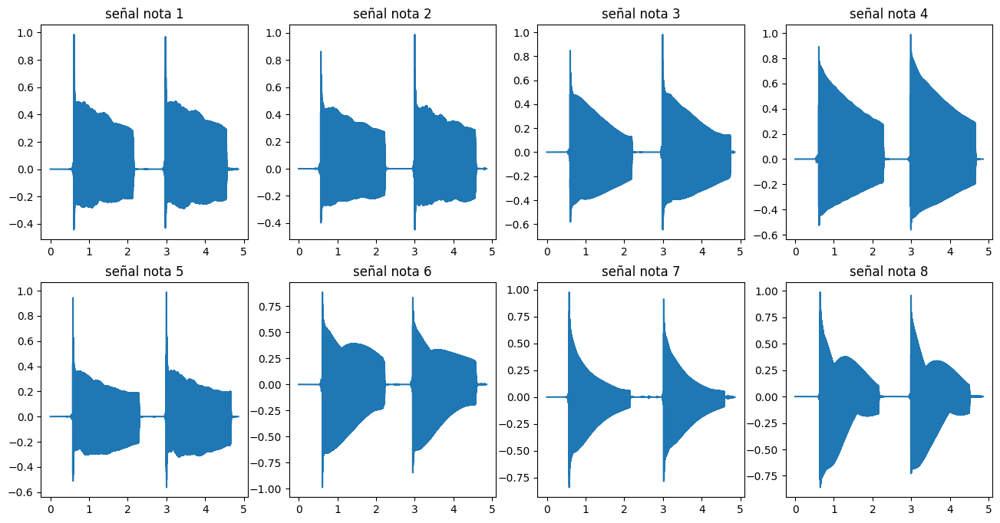

In [ ]:
plt.figure(figsize=(16, 8)) # graficar datos importados
for i in range(8):
  plt.subplot(2,4,i+1)
  plt.plot(time, data[i])
  plt.title("señal nota " + str(i+1))


Tras un corto análisis es posible observar diferencias en cada tipo de señal, denotando diferentes tipos de audios, lo cual se puede validar escuchando algunas muestras de audio, a continuación se procede a escuchar una de ellas:

In [ ]:
IPython.display.Audio("dataset/note" + str(2) + ".mp3")

Para dar un análisis más certero d elas características de cada señal, se realiza un Zoom para validar su comportamiento en ventanas más cortas de tiempo:

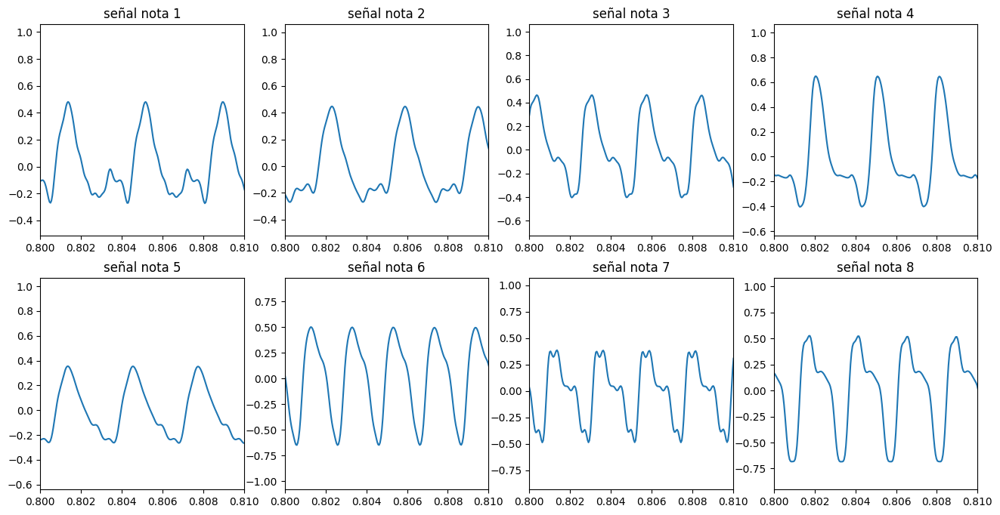

In [ ]:
plt.figure(figsize=(16, 8)) # zoom in data
for i in range(8):
  plt.subplot(2,4,i+1)
  plt.plot(time, data[i])
  plt.title("señal nota " + str(i+1))
  plt.xlim(0.8, 0.810)


### Ejercicio 1
Grafique la densidad espectral (transformada de Fourier de potencia) de cada una de las señales cargadas anteriormente.

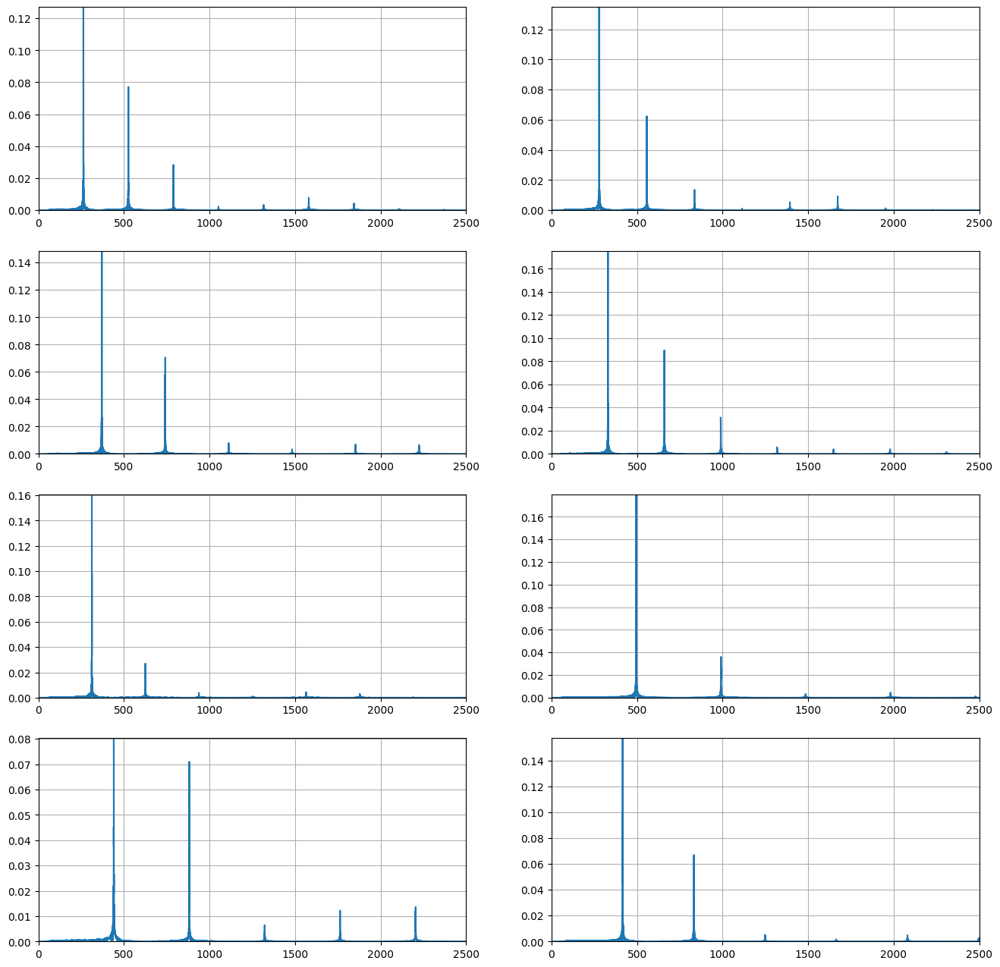

In [ ]:
T = 1./samplerate

plt.figure(figsize=(16, 16))

for i in range(8):
  plt.subplot(4,2,i+1)
  yf = fft(data[i])
  N = len(data[i])
  xf = fftfreq(N, T)[0:N//2]
  yf_abs = 2.0/N * np.abs(yf[0:N//2])
  plt.plot(xf, yf_abs)
  plt.grid()
  plt.xlim([0, 2500])
  plt.ylim([0, yf_abs.max()])

Se gráfica la densidad espectral de cada una de las señales estudiadas, es posible observar por simple inspección los picos de frecuencia diferenciadas para cada una de las notas. Mostrando un comportamiento diferenciado en el dominio de la frecuencia que se ve reflejado, como observamos anteriormente, en el dominio del teimpo.

## Extracción de características estadísticas

In [ ]:
nwin = 512 # num muestras en 25 milisegundos (aproximadamente)
punto_inicial = 22050 # punto inicial 1 segundo

segmentos = []
labels = [] # lista de caracteristicas
mean = []
var = []
kur = []

for i in range(8):
  for j in range(20):
    aux1 = data[i][punto_inicial + j*nwin : punto_inicial + (j + 1)*nwin]
    segmentos.append(aux1)
    labels.append(i+1)
    mean.append(aux1.mean())
    var.append(aux1.var())
    kur.append(sp.stats.kurtosis(aux1))

In [ ]:
mean = np.array(mean).reshape(-1,1)
var = np.array(var).reshape(-1,1)
kur = np.array(kur).reshape(-1,1)
labels = np.array(labels).reshape(-1,1)

car = np.hstack((mean, var, kur, labels))
dataframe = pd.DataFrame(car, columns = ['media','varianza', 'kurtosis', 'labels'])

## Visualización de características utilizando pairplots

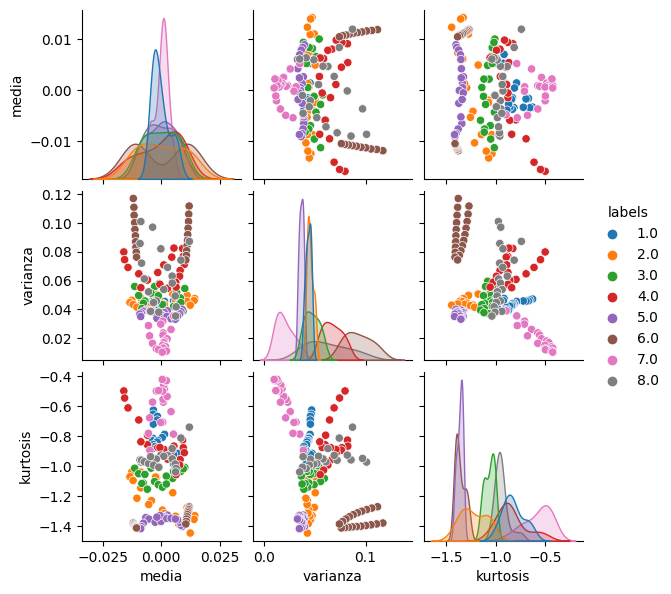

In [ ]:
sns.pairplot(dataframe, hue='labels',palette='tab10', height=2);

Se extraen entonces, para los 8 tipos de notas, usando diferentes tipos de representaciones, datos de las características de las señáles, como lo son su media, varianza y curtosis.

## Extracción de características utilizando autocorrelación

La autocorrelación determina el nivel de dependencia entre los datos observados de una misma serie de tiempo.

$$ R_{XX}(l) = \sum_{n=0}^{N}f(n)f(n-l) $$



### Ejercicio 2
- Calcular la autocorrelación para cada uno de los segmentos extraídos de los datos de entrenamiento.

- Determine el periodo de autocorrelación, es decir el tiempo en el que ocurre el primer pico en la función  de autocorrelación obtenida.  Almacene estos resultados y úselos como una nueva característica.

- Finalmente genere una gráfica de pares de variables que contenga esta nueva característica.  ¿Qué puede observar de los resultados, el periodo de la correlación ayuda a diferenciar y/o agrupar los diferentes tipos de sonidos presentes en los datos de entrada?


Se define una función, llamada autocorr, que por medio del uso de la librería numpy nos será de utilidad para calcular la autocorrelación de la señal. Para cada uno de los segmentos de la señales.

In [ ]:
def autocorr(x):
  return np.correlate(x, x, 'full')[len(x)-1:]

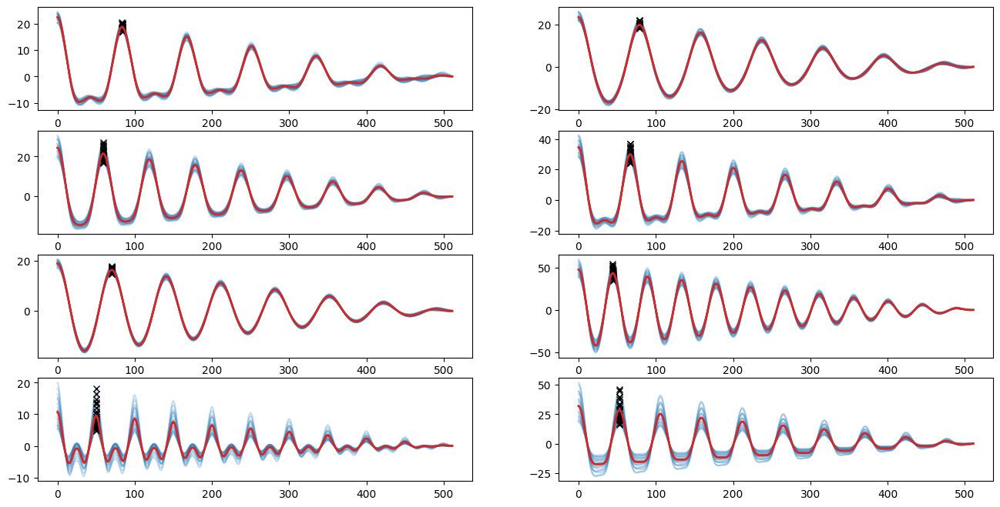

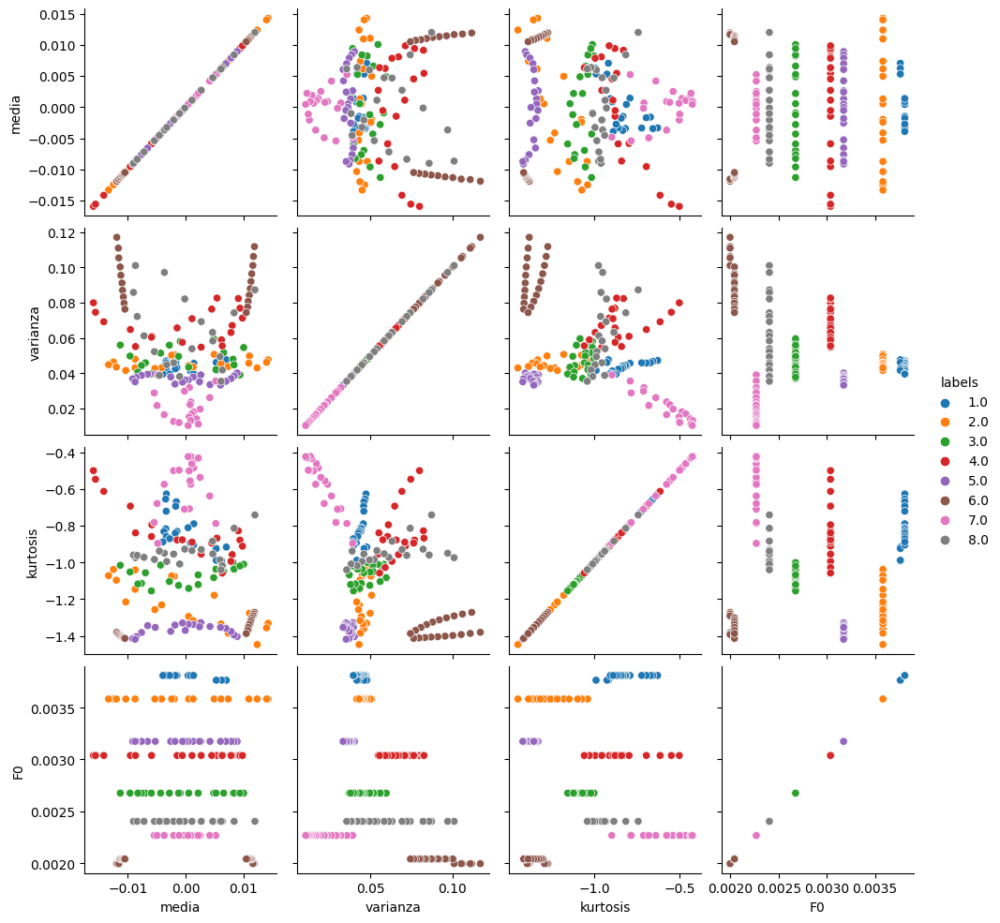

In [ ]:
list_sum = []
muXX = []
T0 = []

plt.figure(figsize=(16,8))
for j in range(8):
  for i in range(20):
    aCorr = autocorr(segmentos[i + 20*j])
    list_sum.append(aCorr)

    peaks, _ = find_peaks(aCorr, distance=512)
    T0.append(time[peaks])

    plt.subplot(4,2,j+1)
    plt.plot(aCorr, 'C0', alpha=0.25)
    plt.plot(peaks, aCorr[peaks], "xk")
    # plt.xlim([0, 100])

  muXX.append(sum(list_sum)/20)
  list_sum = []
  plt.subplot(4,2,j+1)
  plt.plot(muXX[j], 'C3', linewidth=2)

T0 = np.array(T0).reshape(-1,1)

car = np.hstack((mean, var, kur, T0, labels))
dataframe = pd.DataFrame(car, columns = ['media','varianza', 'kurtosis', 'F0', 'labels'])
sns.pairplot(dataframe, hue='labels', diag_kind=None, palette='tab10')

## Transformada tiempo corto de Fourier STFT

[    0.            43.06640625    86.1328125    129.19921875
   172.265625     215.33203125   258.3984375    301.46484375
   344.53125      387.59765625   430.6640625    473.73046875
   516.796875     559.86328125   602.9296875    645.99609375
   689.0625       732.12890625   775.1953125    818.26171875
   861.328125     904.39453125   947.4609375    990.52734375
  1033.59375     1076.66015625  1119.7265625   1162.79296875
  1205.859375    1248.92578125  1291.9921875   1335.05859375
  1378.125       1421.19140625  1464.2578125   1507.32421875
  1550.390625    1593.45703125  1636.5234375   1679.58984375
  1722.65625     1765.72265625  1808.7890625   1851.85546875
  1894.921875    1937.98828125  1981.0546875   2024.12109375
  2067.1875      2110.25390625  2153.3203125   2196.38671875
  2239.453125    2282.51953125  2325.5859375   2368.65234375
  2411.71875     2454.78515625  2497.8515625   2540.91796875
  2583.984375    2627.05078125  2670.1171875   2713.18359375
  2756.25        2799.31

8

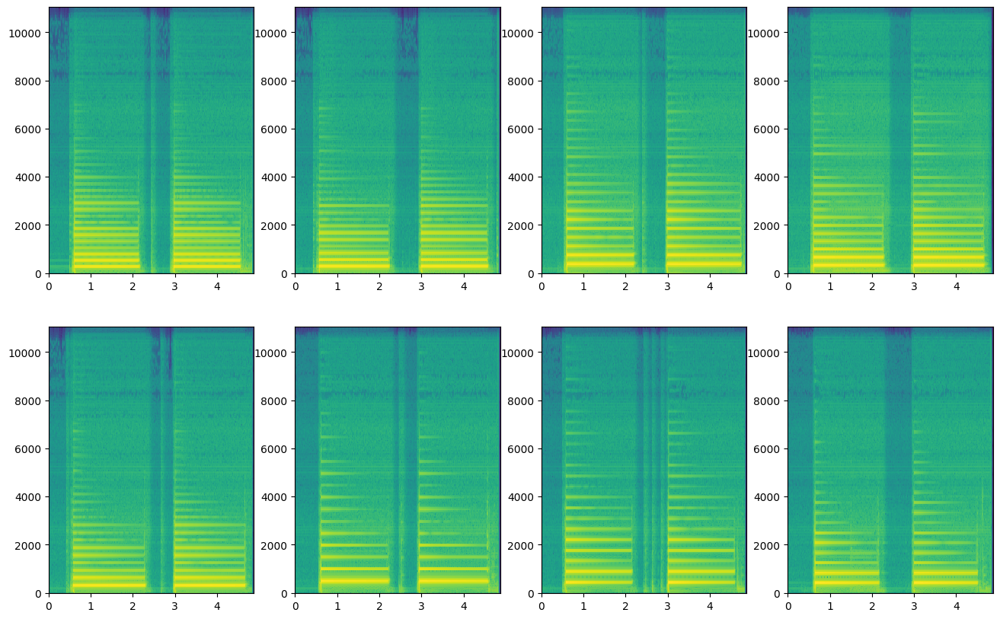

In [ ]:
plt.figure(figsize=[16, 10])
for i in range(len(data)):
  f, t, Zxx = sp.signal.stft(data[i], samplerate, nperseg=512) # generar STFT
  plt.subplot(2,4,i+1)
  plt.pcolormesh(t, f, np.log10(np.abs(Zxx)))
  # plt.title('STFT Magnitude')
  # plt.ylabel('Frequency [Hz]')
  # plt.xlabel('Time [sec]');
print(f)
print(t)
print(Zxx)
len(data)

## Trabajo de Laboratorio

Como trabajo de laboratorio vamos a extraer características de dos tipos diferentes señales de audio.

- El **primer caso** es una grabación de voz que contiene una conversación entre dos personas. El objetivo es encontrar las características que nos permitan establecer en qué momento habla la persona A, o la persona B. Procedimiento:

  1. Cargue los primeros 10 segundos de la señal con el nombre ``voz.mp3``.


Se procede con la carga al espacio de trabajo del archivo voz.mp3, en el que se encuentra una conversación de 1 minuto 44 segundos, entre dos personas, la naturaleza del audio es una grabación en idioma inglés, se gráfica para observar su comportamiento en el dominio del tiempo.

(2312075,)
(220500,)
22050


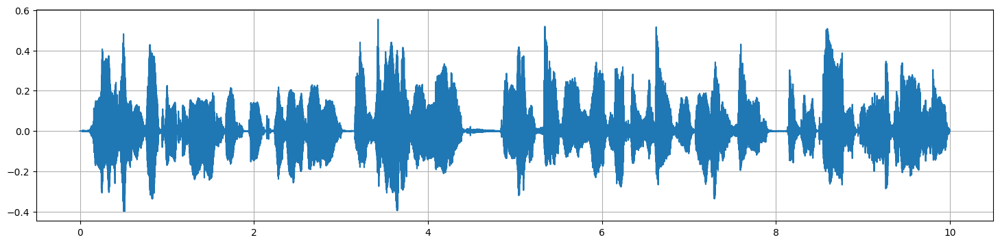

In [ ]:
data, fs = lr.load('voz.mp3')


data2 = data[0:10*fs]


n=data2.size
time2 = np.linspace(0,(n-1)/fs, n)

plt.figure(figsize=(18,4))
plt.plot(time2,data2)
plt.grid()
print(data.shape)
print(data2.shape)
print(fs)

Audio(data, rate=fs)

##Punto 2


2. Estandarice la señal de manera que tenga media cero y desviación estándar 1.

Se utilizan las funciones de las librerías numpy y sklearn, para realizar el preprocesado de las señales, se procede entonces a estandarizar la señal, lo cual se corroborá al verificar que la media de la señál es un número muy aproximado a cero y la desviación estándar es 1. Y se grafica la señal estandarizada validando por simple observación la media de la señal centrada en 0.

De la muestra obtenida se habilita el audio y se cuenta con un audio de 10 segundos, que al escucharlo es posible escuchar dos personas hablar. un hombre y una mujer con clara diferenciación.

La media de la señal Estandarizadaes:  -7.439092e-10
La desviación estándar de la Señal Estandarizada es:  1.0
Los datos estandarizados:  [[0.00016122]
 [0.00016122]
 [0.00016122]
 ...
 [0.05892328]
 [0.06499682]
 [0.06809927]]


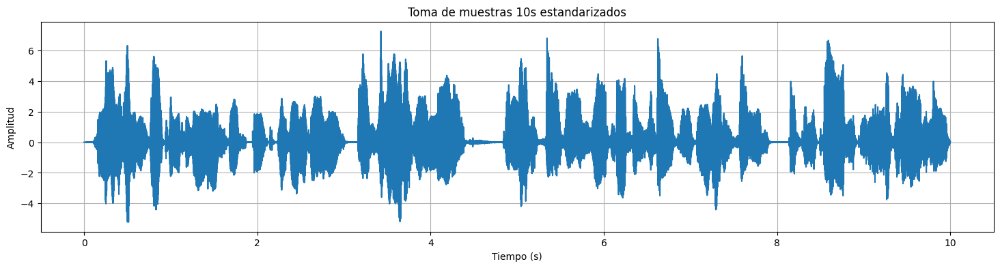

In [ ]:
standardScaler = StandardScaler()
datos_estandarizados= standardScaler.fit_transform(data2.reshape(-1, 1))

#print("Datos Estandarizados: ", datos_estandarizados_lib)

media_est = np.mean(datos_estandarizados)
sigma_est = np.std(datos_estandarizados)

print("La media de la señal Estandarizadaes: ", media_est)
print("La desviación estándar de la Señal Estandarizada es: ", sigma_est)
print("Los datos estandarizados: ", datos_estandarizados)

plt.figure(figsize=(18,4))
plt.plot(time2,datos_estandarizados)
plt.title("Toma de muestras 10s estandarizados")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.grid()
plt.show()

Audio(data2, rate=fs)

##Punto 3 y 4

3. Segmente (enventanar) la señal en ventanas de 50 milisegundos, sin traslape.

4. Para cada ventana de datos extraiga características estadísticas, específicamente: media, varianza, valor máximo, valor mínimo, y el valor rms.

Se realiza el proceso de segmentación o enventanado de la señal y se validan las características sugeridas, se imprimen en consola como vectores con la información.

In [ ]:
nwin = 1102 # num muestras en 50 milisegundos (aproximadamente)

segmentos = []
mean = []
var = []
kur = []
min = []
max = []
rms = []


for j in range(200):
  aux1 = datos_estandarizados[j*nwin : (j + 1)*nwin]
  segmentos.append(aux1)
  mean.append(aux1.mean())
  var.append(aux1.var())
  min.append(aux1.min())
  max.append(aux1.max())
  rms.append(np.sqrt(np.mean(aux1**2)))


print("La media es: ", mean)
print("La varianza es: ", var)
print("El dato minimo es: ", min)
print("El dato máximo es: ", max)
print("El dato rms es: ", rms)



La media es:  [1.9584399e-05, 0.00010183654, 0.00044196477, -0.018281488, -0.008408087, 0.022258203, -0.015788326, 0.011281533, 0.0046845693, 0.0077641197, 0.00037950612, -0.0050996416, 0.013620998, -0.013100541, -0.0034476763, 0.016714223, -0.019516084, 0.0024953417, 0.0038304057, -0.014492463, 0.022457821, -0.021280095, 0.014005749, 0.013178452, -0.0121963965, 0.008960338, -0.025167542, -0.005995295, 0.020899296, -0.014118592, 0.007686139, 0.0054381127, 0.0004293157, -0.0071976166, 0.028103674, -0.02180036, 0.002119358, 0.00033942584, 0.0016459798, -0.02124203, 0.02756058, -0.0063258577, 7.6226876e-05, 0.00021859327, 0.008827054, 0.0040341634, -0.012318002, 0.02608851, -0.0061978376, -0.022489822, 0.01891126, -0.020067235, -0.0136340065, 0.016933959, 0.00377043, 0.005060357, 0.0036648964, -0.023661204, 0.004219401, 0.009557899, -0.0039260597, 0.00017696564, 3.9943065e-05, 0.0020899132, -0.002856419, 0.004380968, -0.008420164, -0.0041408385, 0.018705085, -0.0071460893, -0.0024671727, 

## Punto 5

 5. Grafique las características obtenidas utilizando pairplots y series de tiempo. Analice los resultados y establezca si estas características  nos permiten identificar cuándo habla cada persona. Argumente su respuesta.

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable h

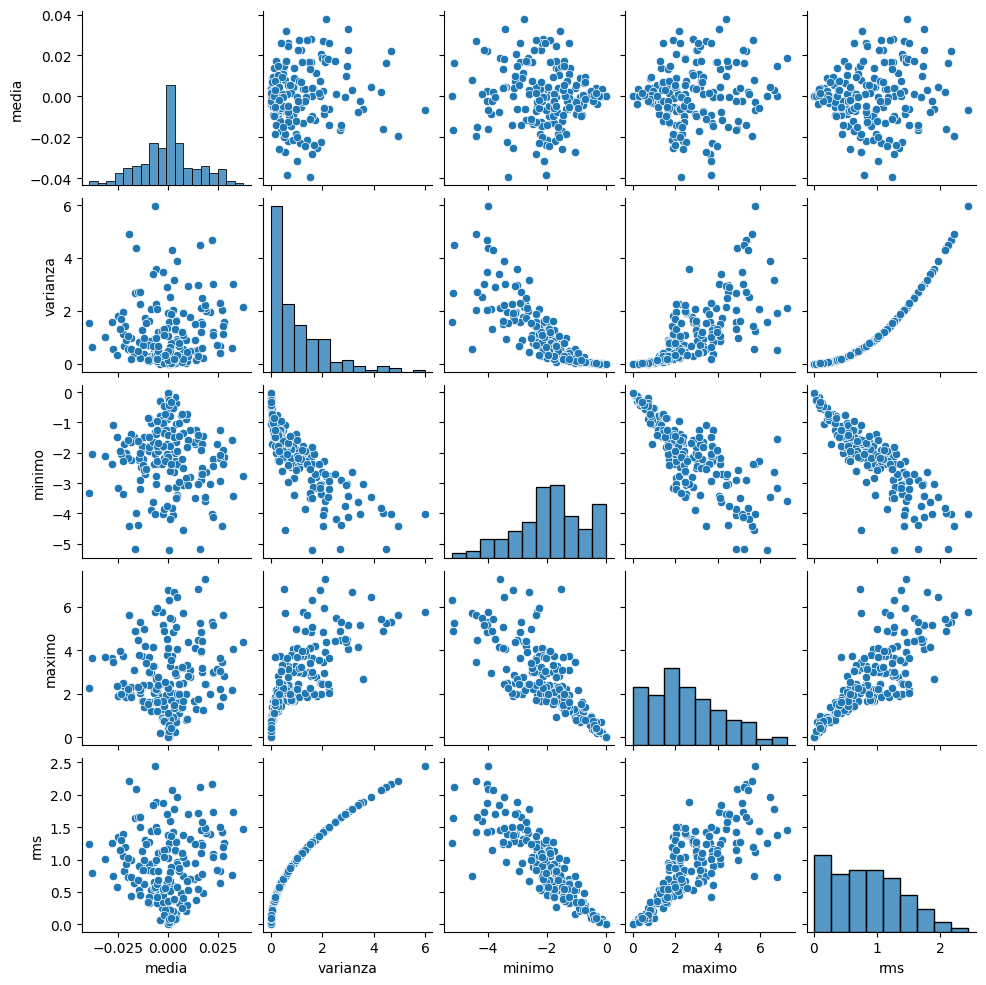

In [ ]:
mean = np.array(mean).reshape(-1,1)
var = np.array(var).reshape(-1,1)
min = np.array(min).reshape(-1,1)
max = np.array(max).reshape(-1,1)
rms = np.array(rms).reshape(-1,1)

labels = np.array(labels).reshape(-1,1)

car = np.hstack((mean, var, min, max, rms))
dataframe = pd.DataFrame(car, columns = ['media','varianza', 'minimo', 'maximo', 'rms'])


sns.pairplot(dataframe,palette='tab10', height=2);
plt.show()

Tras analizar cada una de las relaciones y las gráficas obtenidas de pairplots es posible realizar ciertas afirmaciones, de acuerdo con cada una de las características ilustradas en la gráfica anterior, un ejemplo es que la media es la caracteristica que más dispersión aporta en los grupos de datos que se intentan formar, haciendo complejo la identificación de cada grupo de voz formado.

No así, los demás tipos de datos, cuyas combinaciones intentan formar a simple vista dos tipos de grupos diferenciados, lograndolo en algunos casos, siendo estos minimo vs máximo y su homologo intercambiando ejes. igualmente los pares de máximo vs rms y mínimo vs rms permiten formar grupos de datos que puedan dar pie a una análisis más profundos de los dos tipos de grupos de muestras segmentados. y dar paso a etapas más avanzadas, por ejemplo, clustering para una solución basada en inteligencia computacional.

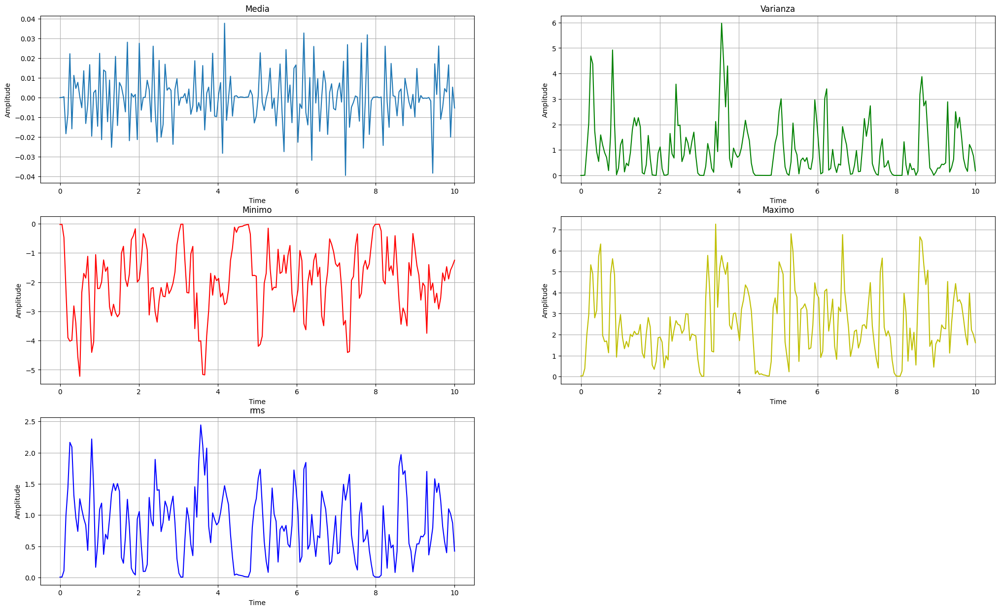

In [ ]:
t=np.linspace(0,10,200)

plt.figure(figsize=(25,15))
plt.subplot(3,2,1)
plt.plot(t,mean)
plt.title('Media')
plt.xlabel('Time',fontsize=10)
plt.ylabel('Amplitude',fontsize=10)
plt.grid()


plt.subplot(3,2,2)
plt.plot(t,var,'-g')
plt.title('Varianza')
plt.xlabel('Time',fontsize=10)
plt.ylabel('Amplitude',fontsize=10)
plt.grid()


plt.subplot(3,2,3)
plt.plot(t,min,'-r')
plt.title('Minimo')
plt.xlabel('Time',fontsize=10)
plt.ylabel('Amplitude',fontsize=10)
plt.grid()

plt.subplot(3,2,4)
plt.plot(t,max,'-y')
plt.title('Maximo')
plt.xlabel('Time',fontsize=10)
plt.ylabel('Amplitude',fontsize=10)
plt.grid()

plt.subplot(3,2,5)
plt.plot(t,rms,'-b')
plt.title('rms')
plt.xlabel('Time',fontsize=10)
plt.ylabel('Amplitude',fontsize=10)
plt.grid()

plt.show()


Tras analizar las gráficas obtenidas en el dominio del tiempo se puede concluir que estas caracteristicas tanto para las graficas en pairplots y en cada serie de tiempo es dificil identificar una voz de la otra, ya que no hay caracteristicas que nos muestren una diferencia de una voz a la otra, como por ejemplo el tono o agudeza de la voz, la dificultad radica al no formarse grupos que nos puedan determinar cada uno.

## Punto 6

 6. A continuación, calcule y grafique la transformada de Fourier de todos los datos (audio sin enventanar). Compare estos resultados con la transformada de tiempo corto de Fourier (STFT), es decir, aplicar la transformada de Fourier a cada una de las ventanas o segmentos obtenidos en el punto 2 del procedimiento (espectrograma). ¿Qué diferencia encuentra entre estas dos representaciones? ¿cuál nos permite establecer cambios en el espectro con respecto al tiempo? ¿Qué información puede extraer e interpretar del espectrograma de la señal?

### Transformada de Fourier

(220500,)


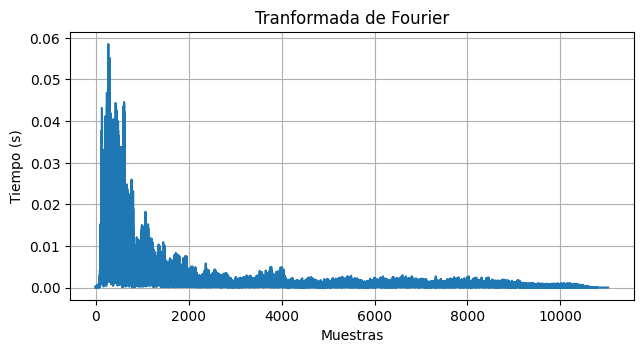

In [ ]:
from scipy.fft import fft, fftfreq

datos_estandarizados=datos_estandarizados.reshape(220500,)

T = 1./samplerate

plt.figure(figsize=(16, 16))


plt.subplot(4,2,1)
yf = fft(datos_estandarizados)
N = len(datos_estandarizados)
xf = fftfreq(N, T)[0:N//2]
yf_abs = 2.0/N * np.abs(yf[0:N//2])
plt.plot(xf, yf_abs)
plt.ylabel('Tiempo (s)')
plt.xlabel('Muestras')
plt.title('Tranformada de Fourier')
plt.grid()

print(datos_estandarizados.shape)

### Transformada de tiempo corto de Fourier (STFT)

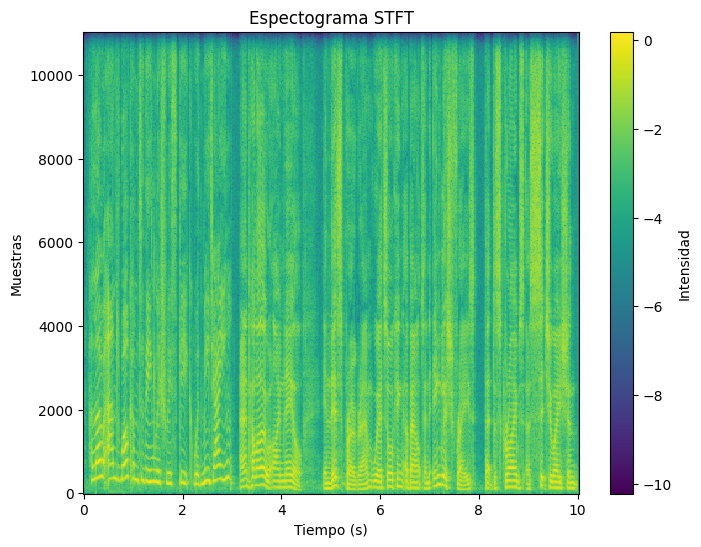

In [ ]:
datos_estandarizados=datos_estandarizados.reshape(220500,)

plt.figure(figsize=[8, 6])

f, t, Zxx = sp.signal.stft(datos_estandarizados, samplerate, nperseg=1102)  # Generar STFT
plt.pcolormesh(t, f, np.log10(np.abs(Zxx)))
plt.colorbar(label='Intensidad')
plt.xlabel('Tiempo (s)')
plt.ylabel('Muestras')
plt.title('Espectograma STFT')
plt.show()



### ¿Qué diferencia encuentra entre estas dos representaciones?

Inicialmente, se realiza el cálculo de la Transformada de Fourier, esta implica el uso de toda la señal de audio completa para un análisis más relevante, proporcionando una representación, ahora en el dominio de la frecuencia, del contenido espectral de la señal a lo largo de toda la duración de la señal, como se puede observar en el gráfico, no podemos observar la variación en el espectro a lo largo del tiempo.

A Diferencia de la transformada de Fourier, la Transformada de Tiempo Corto de Fourier, mejor conocida como STFT, nos permite calcular la transformada de Fourier por medio del uso de técnicas de enventanados y así analizar pequeñas muestras de la señal, por cada ventana.

Esta nos proporciona una representación del contenido espectral en función del tiempo, donde se puede apreciar cambios en el espectro con respecto al tiempo, este tipo de cambios pueden ser debido a cambios en la frecuencia o la intensidad de sus compoenentes.

### ¿cuál nos permite establecer cambios en el espectro con respecto al tiempo?

Tras el anterior análisis expuesto anteriormente, es correcto afirmar que la Transformada de Tiempo Corto de Fourier es aquella que nos permite establecer cambios en el espectro con respecto al tiempo, mientras que la Transformada de Fourier nos brinda una visión global del espectro a lo largo de toda la señal de audio analizada.

### ¿Qué información puede extraer e interpretar del espectrograma de la señal?

La información que es posible extraer del espectrograma incluye la identificación de patrones temporales, esto puede deberse a identificar cuando una persona u otra habla u obtenemos silencios, al contar con tipos de voz muy diferentes podemos realizar un análisis de cambios de frecuencia o en la intensidad, duración de eventos y otros aspectos relacionados con la dinámica temporal de la señal de audio.

Esta es un muy poderosa herramienta para el análisis y procesamiento de señales de audio en una amplia gama de aplicaciones, como procesamiento de voz, música, análisis de sonidos ambientales y más.

#Punto 7

  7. Investigue cómo utilizar un detector de frecuencia fundamental (F0) implementado en la librería ``librosa``, específicamente el algoritmo ``librosa.yin`` ([documentación](https://librosa.org/doc/0.10.1/generated/librosa.yin.html#librosa.yin)), y aplíquelo a la señal completa de voz. Grafique el resultado obtenido con respecto al tiempo e interprete los resultados. ¿Qué tipo de información podemos extraer o interpretar de estos resultados? Argumente su respuesta.

Tras el estudio de la documentación de la librería propuesta, encontramos los siguentes parámetros:

**Frecuencia Fundamental (F0):** La línea azul en el gráfico representa la frecuencia fundamental a lo largo del tiempo. Esta frecuencia fundamental corresponde al tono de la voz en el hablante o cantante percibido por el oyente.

La F0 es importante en la percepción del timbre y la entonación en el habla y la música.

**Tiempo:** El eje horizontal muestra el tiempo en segundos. Puedes observar cómo la F0 varía con el tiempo, lo que refleja las variaciones en el tono de la voz a medida que se pronuncian diferentes sílabas, palabras y frases.

**F0 Nula o No Detectada:** En algunos casos, la F0 puede no detectarse y aparecer como valores cercanos a cero.

Esto puede ocurrir en momentos de silencio o cuando la voz no es claramente detectable en la señal.

**Zonas con Cambios en la F0:** Las zonas donde la F0 cambia rápidamente pueden indicar transiciones entre palabras, cambios en la entonación o incluso la presencia de vibrato en el canto.

**Amplitud de la F0:** La amplitud de la F0 puede proporcionar información sobre la intensidad del habla o el canto en diferentes momentos.

[nan nan nan ... nan nan nan]
[False False False ... False False False]
[0.         0.01       0.01       ... 0.01000052 0.0100008  0.04069733]


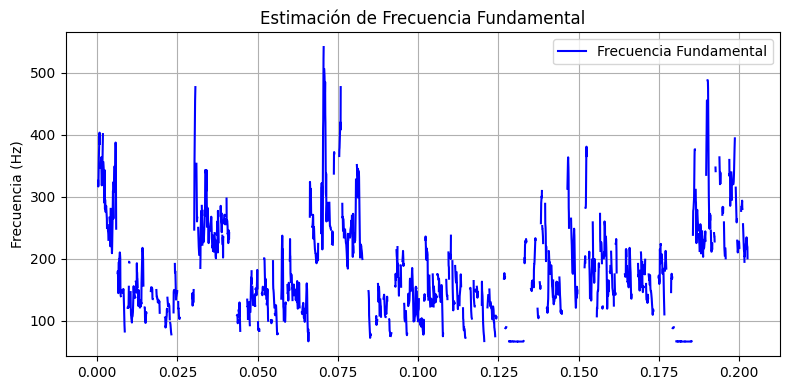

In [ ]:
f0, voiced_flag, voiced_probs = librosa.pyin(data, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))


print(f0)
print(voiced_flag)
print(voiced_probs)

time = np.arange(0, len(f0)) * (1.0 / fs)

# Graficar la frecuencia fundamental con respecto al tiempo
plt.figure(figsize=(8, 4))
plt.plot(time, f0, label='Frecuencia Fundamental', color='b')
plt.ylabel('Frecuencia (Hz)')
plt.title('Estimación de Frecuencia Fundamental')
plt.legend()
plt.tight_layout()
plt.grid()

plt.show()


Al utiliazar las bondades que nos ofrece la librosa.yin y graficar la F0 en función del tiempo, podemos obtener información valiosa sobre la entonación, el ritmo y la variación en la frecuencia de la voz en una señal de audio. Como la señal de audio propuesta, perteneciente a un análisis del habla, para realizar procesamiento de voz y proxiamemente de música.

La interpretación de los resultados depende del contexto específico de la aplicación.

Es posible apreciar entonces los cambios en la frecuencia de la señal, de acuerdo con el dominio del tiempo, los silencios intrinsecos de una conversación entre dos personas, incluso es posible identificar las dos personas que protagonizan la conversación, recalcando el hecho que al ser un hombre y una mujer, y que para el audio especfico escogido se nota una clara diferenciación de sus tonos de voz, contando con una voz más grave para el hombre y una voz más aguda para la mujer, lo que finalmente se traduce en rangos de frecuencia diferentes para cada tipo de persona.

#**Flauta**

###Punto 1 Flauta

- Finalmente, repita todos los puntos del procedimiento anterior, esta vez utilizando la señal ``flauta.mp3``. Este **segundo caso** de estudio es una grabación de audio de una melodía interpretada en flauta. El propósito de este punto es extraer características que nos permitan observar cómo varía la frecuencia fundamental de la señal con respecto al tiempo, es decir, poder observar cuándo ocurre cada una de las notas musicales en la grabación.

  1. Cargue los primeros 10 segundos de la señal con el nombre ``flauta.mp3``.


Se procede con la carga al espacio de trabajo del archivo flauta.mp3, en el que se encuentra una interpretación de 32 segundos, la naturaleza del audio es una grabación en de una flauta, se gráfica para observar su comportamiento en el dominio del tiempo.

(719105,)
(220500,)
22050


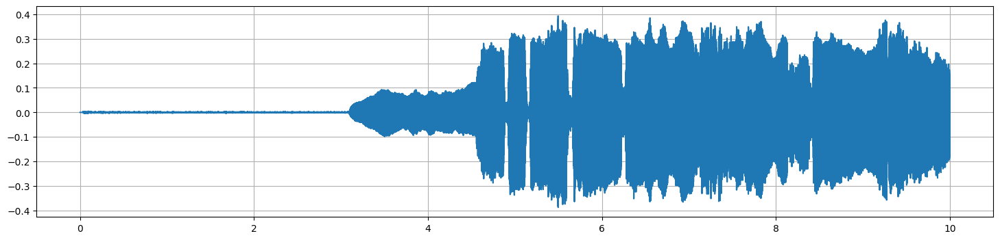

In [ ]:
data, fs = lr.load('flauta.mp3')


data2 = data[0:10*fs]


n=data2.size
time2 = np.linspace(0,(n-1)/fs, n)

plt.figure(figsize=(18,4))
plt.plot(time2,data2)
plt.grid()
print(data.shape)
print(data2.shape)
print(fs)

Audio(data, rate=fs)

###Punto 2 Flauta


2. Estandarice la señal de manera que tenga media cero y desviación estándar 1.

Se utilizan las funciones de las librerías numpy y sklearn, para realizar el preprocesado de las señales, se procede entonces a estandarizar la señal, lo cual se corroborá al verificar que la media de la señál es un número muy aproximado a cero y la desviación estándar es 1. Y se grafica la señal estandarizada validando por simple observación la media de la señal centrada en 0.

De la muestra obtenida se habilita el audio y se cuenta con un audio de 10 segundos, que al escucharlo es posible escuchar dos personas hablar. un hombre y una mujer con clara diferenciación.

La media de la señal Estandarizadaes:  -1.613245e-09
La desviación estándar de la Señal Estandarizada es:  1.0
Los datos estandarizados:  [[-6.0827110e-06]
 [-6.0826828e-06]
 [-6.0820985e-06]
 ...
 [-1.2928476e+00]
 [-1.3339661e+00]
 [-1.3373568e+00]]


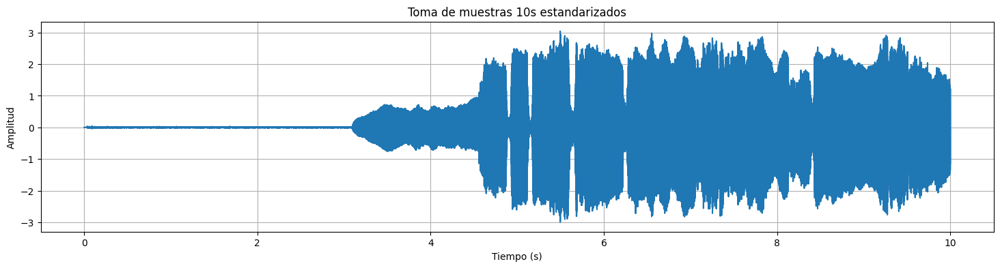

In [ ]:
standardScaler = StandardScaler()
datos_estandarizados= standardScaler.fit_transform(data2.reshape(-1, 1))

#print("Datos Estandarizados: ", datos_estandarizados_lib)

media_est = np.mean(datos_estandarizados)
sigma_est = np.std(datos_estandarizados)

print("La media de la señal Estandarizadaes: ", media_est)
print("La desviación estándar de la Señal Estandarizada es: ", sigma_est)
print("Los datos estandarizados: ", datos_estandarizados)

plt.figure(figsize=(18,4))
plt.plot(time2,datos_estandarizados)
plt.title("Toma de muestras 10s estandarizados")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.grid()
plt.show()

Audio(data2, rate=fs)

###Punto 3 y 4 Flauta

3. Segmente (enventanar) la señal en ventanas de 50 milisegundos, sin traslape.

4. Para cada ventana de datos extraiga características estadísticas, específicamente: media, varianza, valor máximo, valor mínimo, y el valor rms.

Se realiza el proceso de segmentación o enventanado de la señal y se validan las características sugeridas, se imprimen en consola como vectores con la información.

In [ ]:
nwin = 1102 # num muestras en 50 milisegundos (aproximadamente)

segmentos = []
mean = []
var = []
kur = []
min = []
max = []
rms = []


for j in range(200):
  aux1 = datos_estandarizados[j*nwin : (j + 1)*nwin]
  segmentos.append(aux1)
  mean.append(aux1.mean())
  var.append(aux1.var())
  min.append(aux1.min())
  max.append(aux1.max())
  rms.append(np.sqrt(np.mean(aux1**2)))


print("La media es: ", mean)
print("La varianza es: ", var)
print("El dato minimo es: ", min)
print("El dato máximo es: ", max)
print("El dato rms es: ", rms)



La media es:  [0.00015318536, -0.0014700597, 0.0011427312, -0.0013513518, 0.0016015451, -0.0004072582, -0.0005833782, 0.0004356592, -0.0005252645, 0.00027162963, -0.0006250474, 0.0009434524, -0.00027847438, 0.00085612683, -0.00025422202, -0.00064621476, 0.0005696986, -0.0003552267, 0.00019174232, -0.0006427284, 0.00063212, -0.0005898095, 0.0009529212, -0.0011745963, 4.764918e-05, 0.00028139155, -4.802493e-05, 0.00051557797, -0.00069802505, 0.0007059142, -0.00072972267, 0.0015202403, -0.0013922553, 0.00079676975, 0.00036264898, -0.0010027474, 0.00029294446, 0.0006970405, -0.00020337288, -3.2267057e-05, -0.0001152257, 0.00017044424, -0.0003903192, 0.00023302792, -0.00057422067, 0.0007761057, -0.00065635255, 0.0002732239, 0.00021869547, -0.00075180747, 0.0011780015, -0.0007760635, 0.0002927176, 0.0002528352, 0.00018127616, -0.0002913756, -0.0001956056, 0.00044917423, -0.00051622366, 0.00015565396, -4.0592982e-05, 0.0005633599, 0.0010461406, -0.0035936052, 0.0014274874, 0.002989145, 0.0016

###Punto 5

 5. Grafique las características obtenidas utilizando pairplots y series de tiempo. Analice los resultados y establezca si estas características  nos permiten identificar cuándo habla cada persona. Argumente su respuesta.

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable h

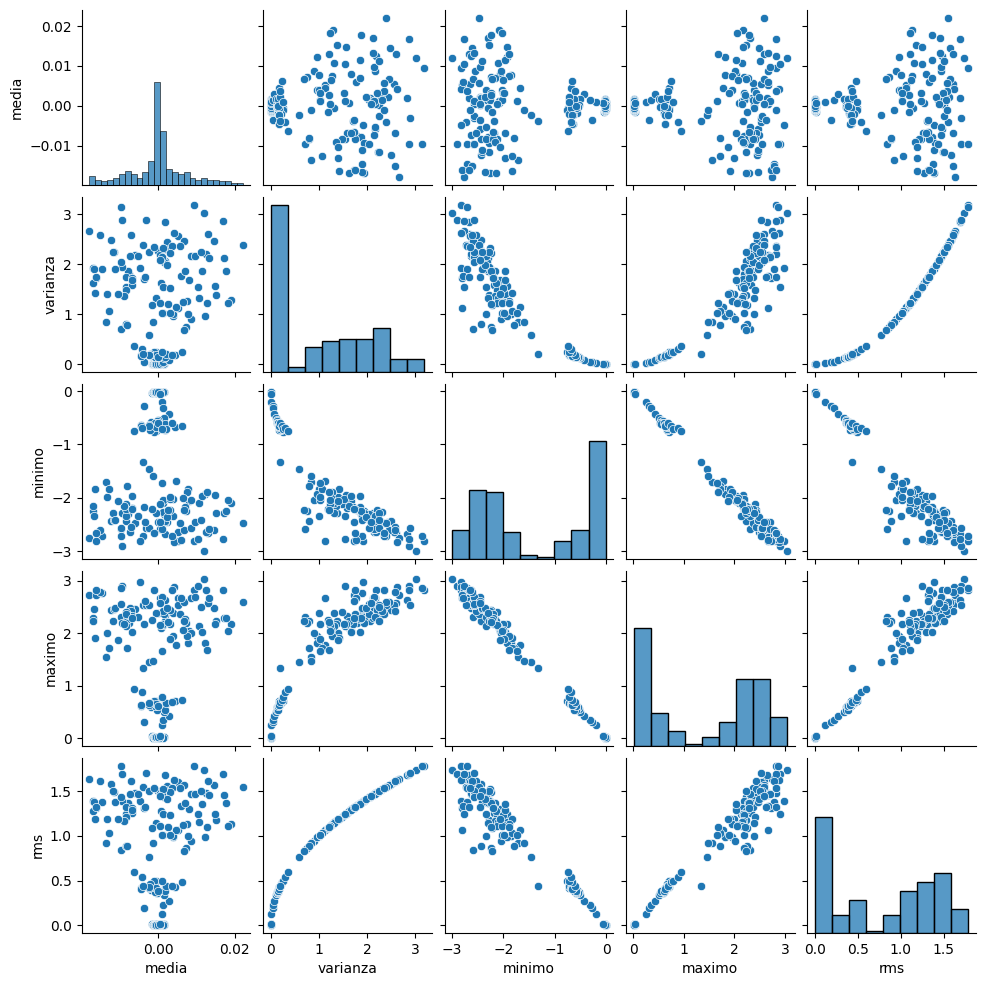

In [ ]:
mean = np.array(mean).reshape(-1,1)
var = np.array(var).reshape(-1,1)
min = np.array(min).reshape(-1,1)
max = np.array(max).reshape(-1,1)
rms = np.array(rms).reshape(-1,1)


car = np.hstack((mean, var, min, max, rms))
dataframe = pd.DataFrame(car, columns = ['media','varianza', 'minimo', 'maximo', 'rms'])

sns.pairplot(dataframe,palette='tab10', height=2);
plt.show()

Al igual que en la representqción de las señáles de voz, en esta oportunidad es posible apreciaqr que ciertos tipos de características extraidas permiten realizar agrupaciónes que darían paso a un análisis más profundo del contenido de información de las señales analizadas, al igual que el caso anterior es posible observar que los máximos, mínimos y la varianza permite realizar ciertas agrupaciones con los tonos escuchados en la melodía.

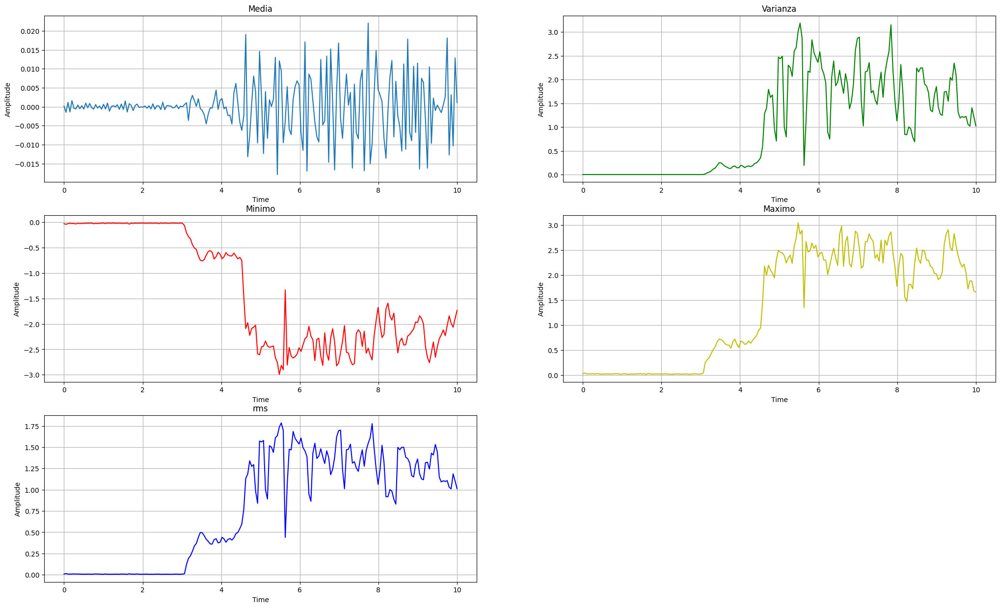

In [ ]:
t=np.linspace(0,10,200)

plt.figure(figsize=(25,15))
plt.subplot(3,2,1)
plt.plot(t,mean)
plt.title('Media')
plt.xlabel('Time',fontsize=10)
plt.ylabel('Amplitude',fontsize=10)
plt.grid()


plt.subplot(3,2,2)
plt.plot(t,var,'-g')
plt.title('Varianza')
plt.xlabel('Time',fontsize=10)
plt.ylabel('Amplitude',fontsize=10)
plt.grid()


plt.subplot(3,2,3)
plt.plot(t,min,'-r')
plt.title('Minimo')
plt.xlabel('Time',fontsize=10)
plt.ylabel('Amplitude',fontsize=10)
plt.grid()

plt.subplot(3,2,4)
plt.plot(t,max,'-y')
plt.title('Maximo')
plt.xlabel('Time',fontsize=10)
plt.ylabel('Amplitude',fontsize=10)
plt.grid()

plt.subplot(3,2,5)
plt.plot(t,rms,'-b')
plt.title('rms')
plt.xlabel('Time',fontsize=10)
plt.ylabel('Amplitude',fontsize=10)
plt.grid()

plt.show()

De las gráficas en el domino del tiempo es posible identificar diferentes similudes entre las señales, estas son, la presencial del silnecio inicial que acompaña la señal, junto con un pequeño componente de ruido. Así mismo los tres momentos que determinan la melodía tocada durante la muestra seleccionada.

###Punto 6

Transformada de Fourier

 6. A continuación, calcule y grafique la transformada de Fourier de todos los datos (audio sin enventanar). Compare estos resultados con la transformada de tiempo corto de Fourier (STFT), es decir, aplicar la transformada de Fourier a cada una de las ventanas o segmentos obtenidos en el punto 2 del procedimiento (espectrograma).

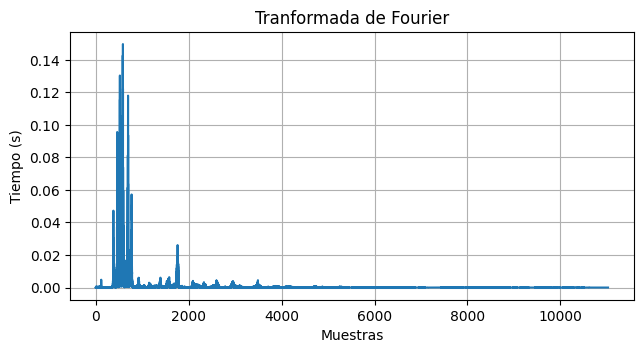

In [ ]:
from scipy.fft import fft, fftfreq

datos_estandarizados=datos_estandarizados.reshape(220500,)

T = 1./samplerate

plt.figure(figsize=(16, 16))

plt.subplot(4,2,1)
yf = fft(datos_estandarizados)
N = len(datos_estandarizados)
xf = fftfreq(N, T)[0:N//2]
yf_abs = 2.0/N * np.abs(yf[0:N//2])
plt.plot(xf, yf_abs)
plt.ylabel('Tiempo (s)')
plt.xlabel('Muestras')
plt.title('Tranformada de Fourier')
plt.grid()

### Transformada de tiempo corto de Fourier (STFT)

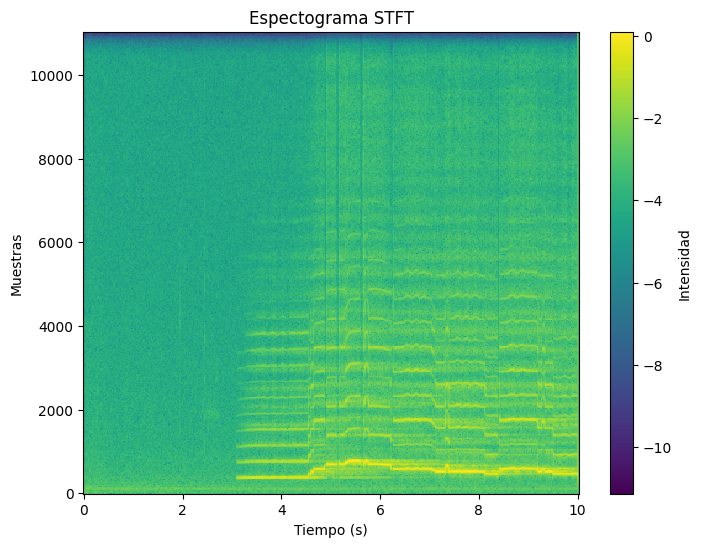

In [ ]:
datos_estandarizados=datos_estandarizados.reshape(220500,)

plt.figure(figsize=[8, 6])

f, t, Zxx = sp.signal.stft(datos_estandarizados, samplerate, nperseg=1102)  # Generar STFT
plt.pcolormesh(t, f, np.log10(np.abs(Zxx)))
plt.colorbar(label='Intensidad')
plt.xlabel('Tiempo (s)')
plt.ylabel('Muestras')
plt.title('Espectograma STFT')
plt.show()

Del gráfico de la transformada de Fourier es posible observar que la mayor cantidad del espectro se encuentra concentrado cerca de la llamada frecuencia fundamental de la señál, denotando ciertos tipos de comportamiento, estos pueden ser, la presencia de un solo tipo de instrumento en toda la interpretación, además de la escazes de ruido blanco, que pueda mostrar componentes de frecuencia a lo largo de toda las muestras de la señal.

Del gráfico de la Transformada de tiempo corto de Fourier (STFT), se puede apreciar, así como es posible apreciarlo en la grabación que se encuentra literales más atrás, un silencio que introduce la interpretación de los instrumentos, igualmente que en la transformada de Fourier de la señal completa, es posible apreciar que la mayor cantidad de intensidad de las frecuencias que acompañan la melocida son muy cercanas y uniformes.

#Punto 7

  7. Investigue cómo utilizar un detector de frecuencia fundamental (F0) implementado en la librería ``librosa``, específicamente el algoritmo ``librosa.yin`` ([documentación](https://librosa.org/doc/0.10.1/generated/librosa.yin.html#librosa.yin)), y aplíquelo a la señal completa de voz. Grafique el resultado obtenido con respecto al tiempo e interprete los resultados. ¿Qué tipo de información podemos extraer o interpretar de estos resultados? Argumente su respuesta.

[         nan          nan          nan ... 394.26624244 391.99543598
 391.99543598]
[False False False ...  True  True  True]
[0.         0.01       0.01       ... 0.24075439 0.27960517 0.42606233]


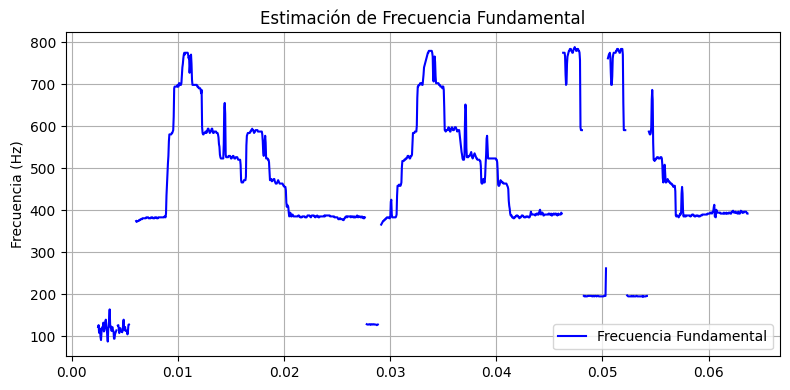

In [ ]:
f0, voiced_flag, voiced_probs = librosa.pyin(data, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))


print(f0)
print(voiced_flag)
print(voiced_probs)

time = np.arange(0, len(f0)) * (1.0 / fs)

# Graficar la frecuencia fundamental con respecto al tiempo
plt.figure(figsize=(8, 4))
plt.plot(time, f0, label='Frecuencia Fundamental', color='b')
plt.ylabel('Frecuencia (Hz)')
plt.title('Estimación de Frecuencia Fundamental')
plt.legend()
plt.tight_layout()
plt.grid()

plt.show()

Finalmente del gráfico de la Estimación de la frecuencia fundamental, es posible apreciar los diferentes tiempos de la señal, esto es el silencio inicial, que si bien para el oido humano pueda ser un silencio, viene acompañado de un pequeño componente de ruido, así mismo se logra diferenciar los momentos en que se tocan las melodías.

## Conclusiones

- La extracción de características es un proceso vital para el procesamiento digital de señales y sus aplicaciones, teniendo en cuenta la alta gama de tipos de señales que existen para representar los fenómenos de la naturaleza, existen aplicaciones que hacen uno de este tipo de estrategias, por ejemplo, para aplicaciones de análisis de audio, sea voz, música, etc. A la par que los procesos de segmentación y enventanado, la extracción de características permite, entre otros, diferencias diferentes tipos de actores en las señales de voz, como pueden ser personas, diferenciándolos por sus tonos de voz, incluso el volumen que usan, como notas musicales, que pueden tener características únicas, que dan paso a técnicas más avanzadas, como lo puede ser técnicas de clustering.

- El análisis de señales en el dominio de la frecuencia es un aliado primordial en el tratamiento y analisis de señales, ya que estás nos permiten observar y analizar la información con otra perspectiva, y aplicar técnicas, por ejemplo de filtrado, donde podemos observar en qué componenetes de frecuencia de la señal se encuentra contenida la mayor cantidad de información, observada en sus componentes de frecuencias.


## Referencias

1. P. Prandoni and M. Vetterli, *Signal Processing for Communications*, ser. Communication and information sciences. CRC Press, 2008.